<a href="https://colab.research.google.com/github/teliofm/COVID-19/blob/master/Infection_Interactive_Simulation_with_Matplolib.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Infection Interactive Simulation**

>In this period of pandemic of Covid-19, the Harry Stevens' article on The *Washington Post* of 2020, March 14th, ["Why outbreaks like coronavirus spread exponentially, and how to *flatten the curve*"](https://www.washingtonpost.com/graphics/2020/world/corona-simulator/) caught my attention.

The simulation itself is very didatic on showing people why staying home and social distancing are the only solution to diminish the spread of the virus and stop the deaths.

>At the same time, I realised how this tool could be of great value to foreseen the behavior of a unique population. Considering its particular social stratum and conditions, as number of people on social distancing, percentage of old people, rate of transmissibility, days to identify the disease, and so on.*

All of these could be simulated and fit to a local curve.

>As a data science and machine learning enthusiastic I have the ability with some **Python´s tools** that could do the same simulation as seen in the article, mainly with the libraries **Matplotlib** and its animation.

Lots still should be done to improve this Python´s tool. I keep going on the evolution of it. Although, before I reach to an end I decided to share with other data science colleagues, so they could also implement improvements to it.

>*The conditions can be simulated along with the speed of moving, size of the body, distance to be infected, etc. And much more can be included, as the number or rate of people at home, deaths and percentage of deaths, social stratum, barriers, etc.

Any data scientist who believes this tool could be useful for the understanding of this virus behavior, or even believe this tool could be useful to solve any other problem feel free to ask me to share the coding, so you could also help to improve the tool. It was written into Google Colab.

Following, the simulation, 1,000 individuals representing the population of a specific location.

The picture shown built with **Matplolib´s Stacked Area Chart** represents the evolution of the infection simulated. It starts with only one $infected$ and the others $healthy$. After a period infected the person is $recovered$, he becomes immune, not transmitting, neither being infected again.

On this simulation all citizens have been infected and later recovered.

A challenge is to animate this chart along with the simulation.

##> Acknowledgment:

This article had the collaboration of some colleagues:

* Plínio Mendes, [Software Engineer at Google](https://www.linkedin.com/in/pliniofm/)

# Simulation

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import gridspec
from IPython.core.display import display, HTML
from base64 import b64encode

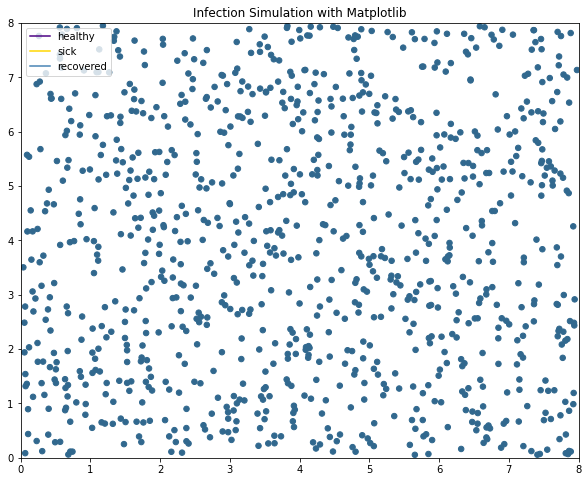

In [28]:
numframes = 1500 # Options: 200 or 600
numpoints = 1000 # Options: 25, 50 or 100
fps = 30 # Options: 60 or 30
size_space = 0.05 # Options: 0.03 or 0.05 (Crash adjustment)
size_chart = 30 # Options: 100 or 50
speed = 0.015 # Options: 0.005 or 0.015
map_length = 8 # Options: 1 or 4
frames_to_recover = 400
position1stinfected = np.random.randint(1, high=numpoints+1,size=1) # random position for first infected

colorHealthy = 0.6 # ~ "indigo"
colorSick = 0.9 # ~ "gold"
colorRecovered = 0.7 # ~ "steelblue"

# Spreading kndly homogenous the people, so they can´t begin one upon another
# Final x, y array are the cartesian position of them
x1 = np.linspace(0.2,map_length-0.2,numpoints//13)
x2 = np.linspace(0.2,map_length-0.2,numpoints//13)
x3 = np.linspace(0.2,map_length-0.2,numpoints//13)
x4 = np.linspace(0.2,map_length-0.2,numpoints//13)
x5 = np.linspace(0.2,map_length-0.2,numpoints//13)
x6 = np.linspace(0.2,map_length-0.2,numpoints//13)
x7 = np.linspace(0.2,map_length-0.2,numpoints//13)
x8 = np.linspace(0.2,map_length-0.2,numpoints//13)
x9 = np.linspace(0.2,map_length-0.2,numpoints//13)
x10 = np.linspace(0.2,map_length-0.2,numpoints//13)
x11 = np.linspace(0.2,map_length-0.2,numpoints//13)
x12 = np.linspace(0.2,map_length-0.2,numpoints//13)
x13 = np.linspace(0.2,map_length-0.2,numpoints-12*int(numpoints//13))
x = np.append(x1,x2)
x = np.append(x,x3)
x = np.append(x,x4)
x = np.append(x,x5)
x = np.append(x,x6)
x = np.append(x,x7)
x = np.append(x,x8)
x = np.append(x,x9)
x = np.append(x,x10)
x = np.append(x,x11)
x = np.append(x,x12)
x = np.append(x,x13)
y1 = np.full((1,numpoints//13), 0.2)
y2 = np.full((1,numpoints//13), 1*((map_length-0.2)/12))
y3 = np.full((1,numpoints//13), 2*((map_length-0.2)/12))
y4 = np.full((1,numpoints//13), 3*((map_length-0.2)/12))
y5 = np.full((1,numpoints//13), 4*((map_length-0.2)/12))
y6 = np.full((1,numpoints//13), 5*((map_length-0.2)/12))
y7 = np.full((1,numpoints//13), 6*((map_length-0.2)/12))
y8 = np.full((1,numpoints//13), 7*((map_length-0.2)/12))
y9 = np.full((1,numpoints//13), 8*((map_length-0.2)/12))
y10 = np.full((1,numpoints//13), 9*((map_length-0.2)/12))
y11 = np.full((1,numpoints//13), 10*((map_length-0.2)/12))
y12 = np.full((1,numpoints//13), 11*((map_length-0.2)/12))
y13 = np.full((1,numpoints-12*int(numpoints//13)), map_length-0.2)
y = np.append(y1,y2)
y = np.append(y,y3)
y = np.append(y,y4)
y = np.append(y,y5)
y = np.append(y,y6)
y = np.append(y,y7)
y = np.append(y,y8)
y = np.append(y,y9)
y = np.append(y,y10)
y = np.append(y,y11)
y = np.append(y,y12)
y = np.append(y,y13)

# Setting the initial random direction to go forward (the diretion inverts when touching another person or the boundaries)
ang = np.random.random((1, numpoints)) * np.pi * 2
vx = (np.sin(ang) * speed)[0]
vy = (np.cos(ang) * speed)[0]

# Setting randomly which person will begin as infected 
color = np.append( np.append( (np.full((1, int(position1stinfected)), [colorHealthy])[0]), [colorSick]), (np.full((1, numpoints - int(position1stinfected) - 1), [colorHealthy])[0] )) 
sickT0 = np.zeros(numpoints)

# Setting both Charts to animate
fig = plt.figure(figsize=(10,8))
#gs = gridspec.GridSpec(2,1,height_ratios=[1,5]) 
#ax1 = plt.subplot(gs[0])
#ax2 = plt.subplot(gs[1])
gs = gridspec.GridSpec(1,1,height_ratios=[1]) 
ax2 = plt.subplot(gs[0])

# Lower Chart with people interacting socially
scat = ax2.scatter(x, y, c=color, s=size_chart)
plt.xlim(0, map_length)
plt.ylim(0, map_length)
#plt.xticks([])
#plt.yticks([])
plt.title('Infection Simulation with Matplotlib')

plt.plot([],[], color="indigo", label='healthy')
plt.plot([],[], color="gold", label='sick')
plt.plot([],[], color="steelblue", label='recovered')
plt.legend(loc='upper left')

# Creating the Array to update the animation contabilizing the condition of each person  
aHealthy = np.full((1,numframes),0).reshape((numframes, ))
aHealthy[0] = numpoints-1
aSick = np.full((1,numframes),0).reshape((numframes, ))
aSick[0] = 1
aRecovered = np.zeros(numframes)

# The built of Dataframe is necessary for plotting the Stacked Area Chart
#Healthy = pd.DataFrame(aHealthy, columns=['Healthy'])
#Sick = pd.DataFrame(aSick, columns=['Sick'])



# Upper Chart with the evolution of people condition (others can be included in the future, as Infected and Sick, and Recovered)
#stack = ax1.stackplot(range(0,numframes), Sick['Sick'], Healthy['Healthy'], labels=['Sick','Healthy'])
#plt.legend(loc='upper left')
#plt.xlabel('Time')
#plt.ylabel('# People')
#plt.margins(0,0)

def update_plot(frame):
    global color, x, y, vx, vy
    scat.set_offsets(np.array([x, y]).transpose())
    scat.set_array(color)
    x = x + vx
    y = y + vy
#    Healthy.at[frame,'Healthy'] = np.count_nonzero(color == colorHealthy)
#    Sick.at[frame,'Sick'] = np.count_nonzero(color == colorSick)
    aHealthy[frame] = np.count_nonzero(color == colorHealthy)
    aSick[frame] = np.count_nonzero(color == colorSick)
    aRecovered[frame] = np.count_nonzero(color == colorRecovered)
    for i in range(len(x)):
      if x[i] < size_space or x[i] > map_length - size_space:
        vx[i] = -vx[i]
        x[i] += vx[i]
      if y[i] < size_space or y[i] > map_length - size_space:
        vy[i] = -vy[i]
        y[i] += vy[i]
      if color[i] == colorSick and (frame - sickT0[i] > frames_to_recover):
        color[i] = colorRecovered
      for j in range(i + 1, len(x)):
        dist = np.sqrt((x[i] - x[j]) ** 2 + (y[i] - y[j]) ** 2)
        if dist < size_space:
          if color[i] == colorSick and color[j] == colorHealthy:
            sickT0[j] = frame
            color[j] = colorSick
          elif color[i] == colorHealthy and color[j] == colorSick:
            sickT0[i] = frame
            color[i] = colorSick
          vx[i] = -vx[i]
          vx[j] = -vx[j]
          vy[i] = -vy[i]
          vy[j] = -vy[j]

    return scat,

ani = animation.FuncAnimation(fig, update_plot, frames=range(numframes))
ani.save('basic_animation.mp4', fps=fps, extra_args=['-vcodec', 'libx264'])

#plt.show()

mp4 = open('basic_animation.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [31]:
aSick

array([0, 1, 1, ..., 0, 0, 0])

In [29]:
aHealthy

array([  0, 999, 999, ...,   0,   0,   0])

In [30]:
aRecovered,

(array([1000.,    0.,    0., ..., 1000., 1000., 1000.]),)

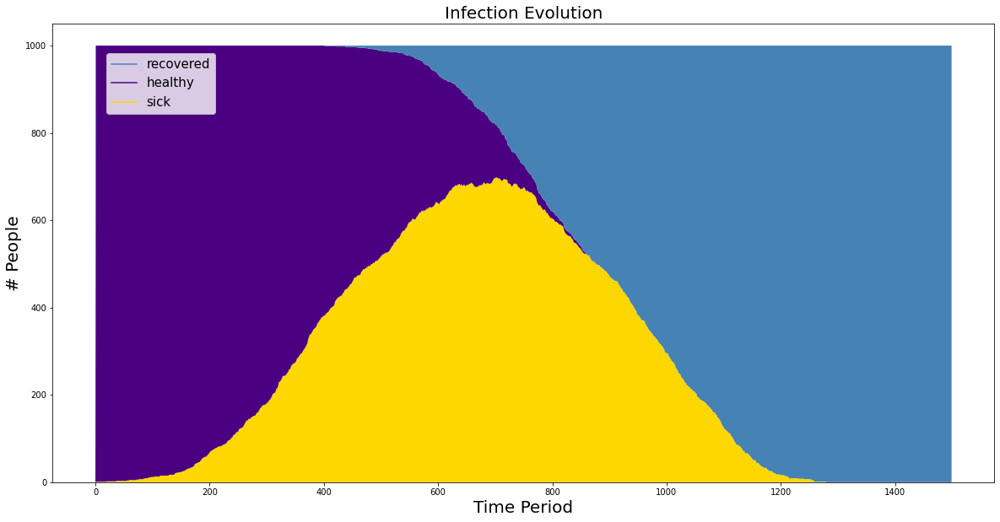

In [33]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))

plt.plot([],[], color="steelblue", label='recovered')
plt.plot([],[], color="indigo", label='healthy')
plt.plot([],[], color="gold", label='sick')

plt.legend(loc="upper left", bbox_to_anchor=(0.05, 0.95), fontsize=15)
plt.title('Infection Evolution', size=20)
plt.xlabel('Time Period', size=20)
plt.ylabel('# People', size=20)
plt.xticks(size=10)
plt.yticks(size=10)

plt.stackplot(range(numframes), aSick, aHealthy, aRecovered, colors=['gold', 'indigo', 'steelblue'])

plt.show()